# Pertemuan 4

import berhasil


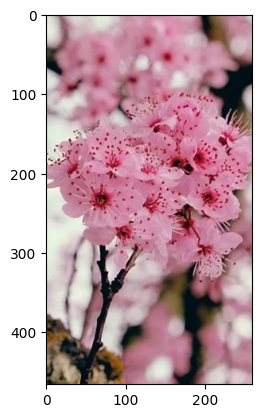

In [23]:
import skimage
import skimage.io
import numpy as np
import matplotlib.pyplot as plt
import skimage.io as skm


import matplotlib.pyplot as plt

print("import berhasil")

image = skm.imread("OIP.jpeg")

plt.imshow(image)

In [24]:
image.shape

(466, 260, 3)

In [25]:
image.ndim

3

In [26]:
# The number of pixels
image.size  # 720, 1080, 3)

363480

In [27]:
def show(image: np.ndarray, title="Image", cmap_type="gray", axis=False):
    """
    A function to display np.ndarrays as images
    """
    plt.imshow(image, cmap=cmap_type)
    plt.title(title)
    if not axis:
        plt.axis("off")
    plt.margins(0, 0)
    plt.show();

In [28]:
def compare(
    original,
    filtered,
    title_filtered="Filtered",
    cmap_type="gray",
    axis=False,
    title_original="Original",
):
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 8), sharex=True, sharey=True)

    ax1.imshow(original, cmap=cmap_type)
    ax1.set_title(title_original)

    ax2.imshow(filtered, cmap=cmap_type)
    ax2.set_title(title_filtered)

    if not axis:
        ax1.axis("off")
        ax2.axis("off")
    plt.subplots_adjust(top=1, bottom=0, right=1, left=0, hspace=0, wspace=0.01)
    plt.margins(0, 0)
    plt.show();

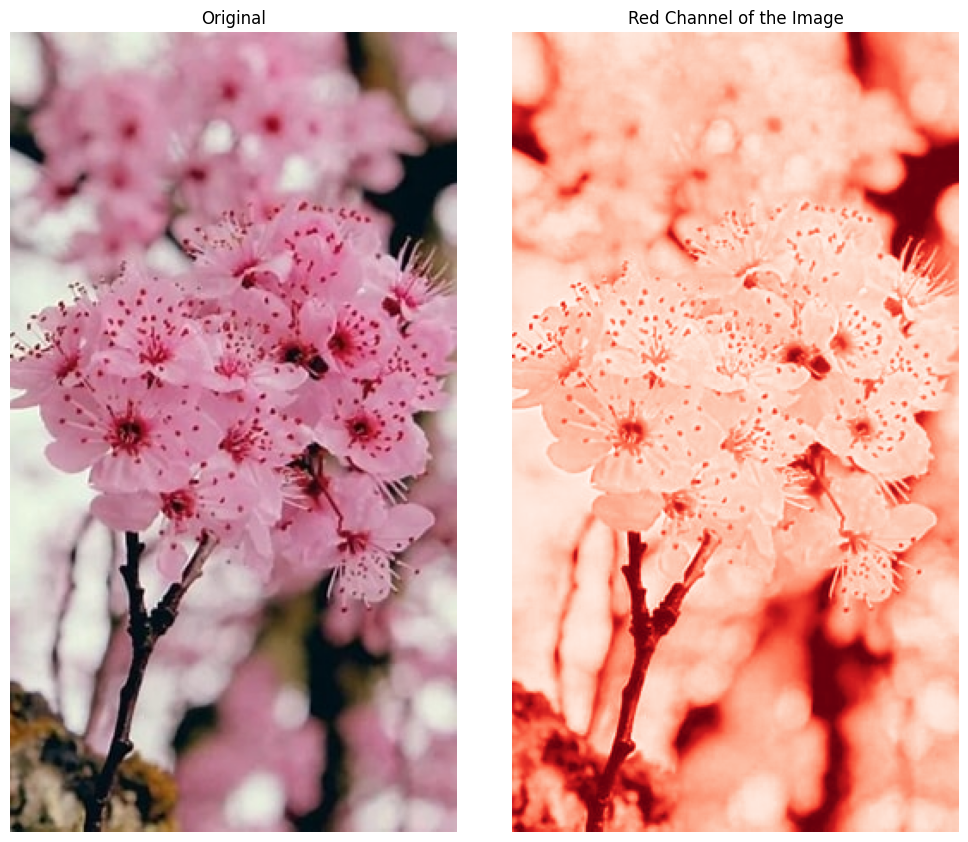

In [29]:
red = image[:, :, 0]
compare(image, red, "Red Channel of the Image", cmap_type="Reds_r")


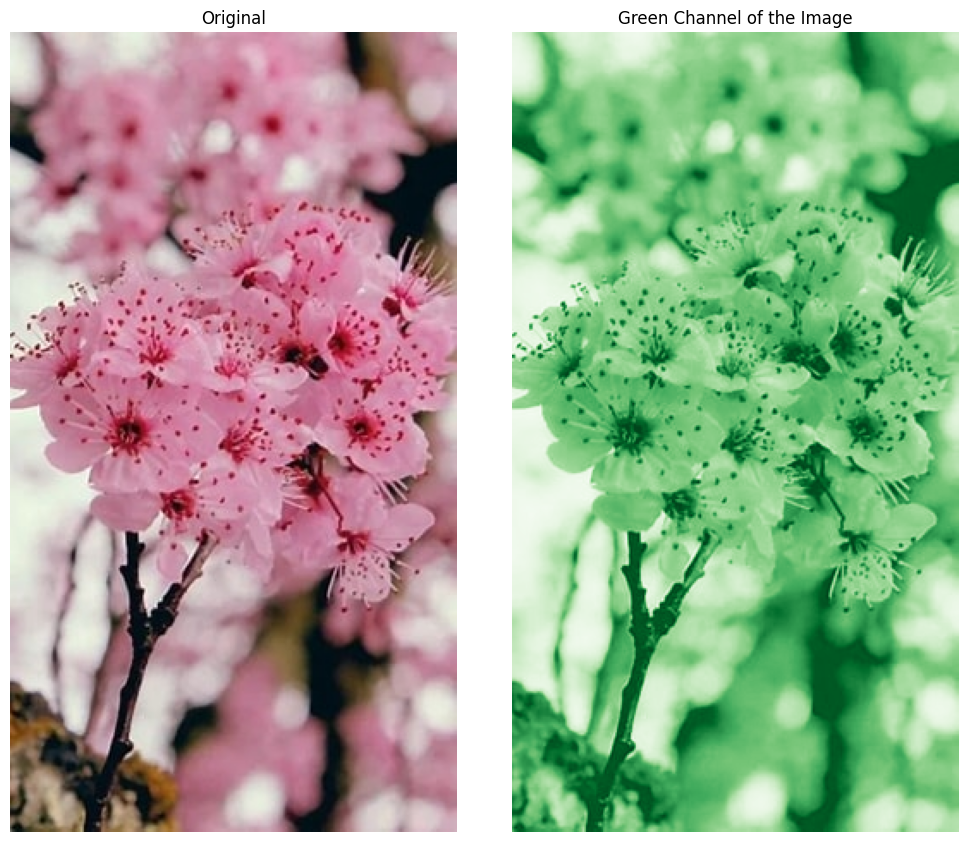

In [30]:
green = image[:, :, 1]

compare(image, green, "Green Channel of the Image", "Greens_r")

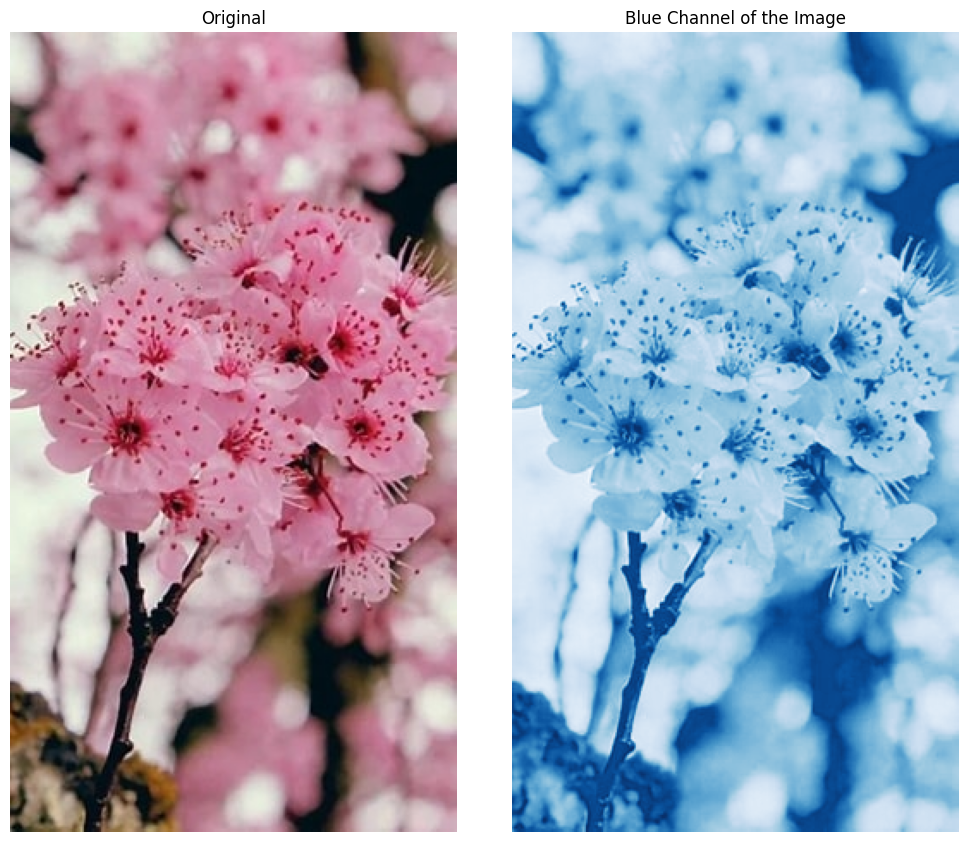

In [31]:
blue = image[:, :, 2]

compare(image, blue, "Blue Channel of the Image", "Blues_r")

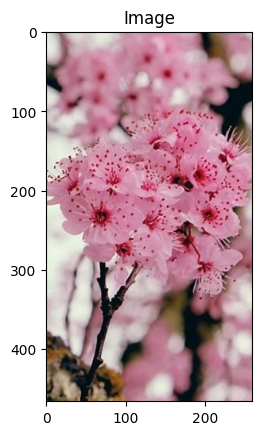

In [32]:
show(image, axis=True)

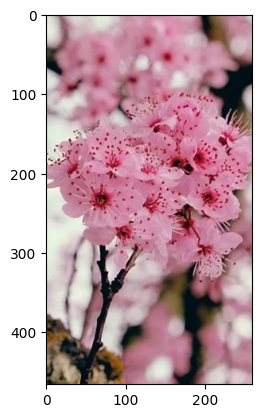

In [33]:
plt.imshow(image)

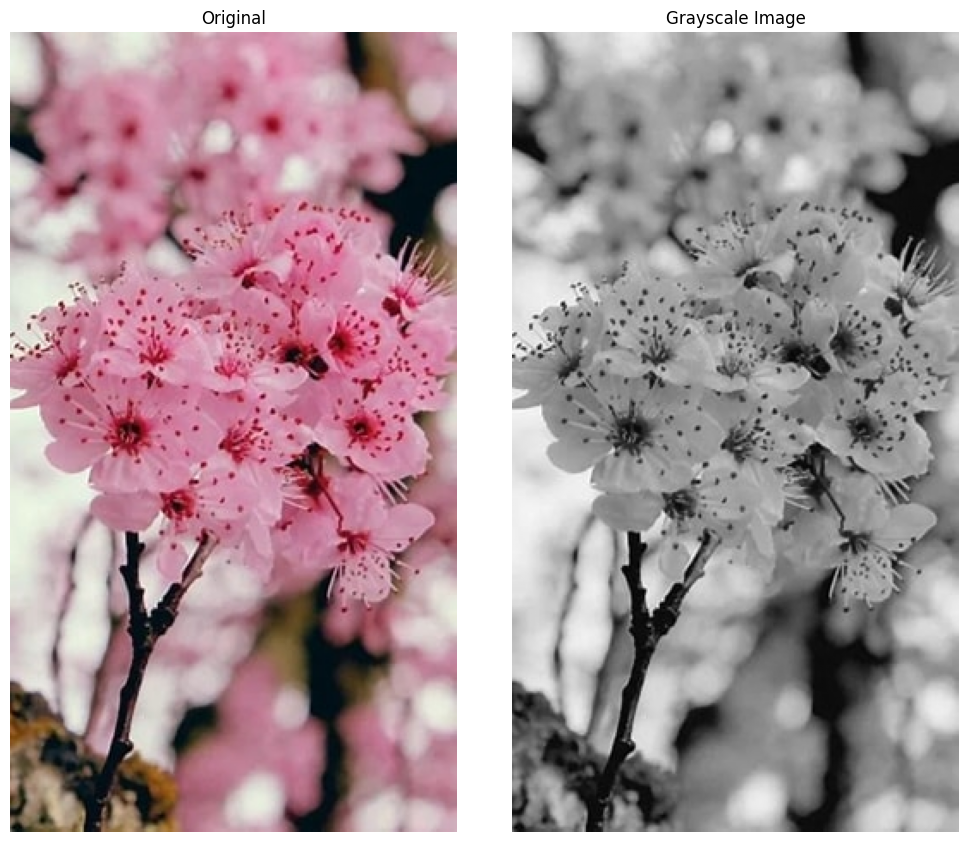

In [34]:
from skimage.color import rgb2gray
gray = rgb2gray(image)

compare(image, gray, "Grayscale Image")

In [35]:
image.shape

(466, 260, 3)

In [36]:
gray.shape

(466, 260)

In [37]:
gray.size

121160

In [38]:
list2D = [[10,20,30, 90,100],[40,20,30, 100,99],[70,90,100, 120,80],[0,10,20,30,77],[10,20,30, 90,11]]
x = np.array(list2D, np.int32)
print(x)

[[ 10  20  30  90 100]
 [ 40  20  30 100  99]
 [ 70  90 100 120  80]
 [  0  10  20  30  77]
 [ 10  20  30  90  11]]


In [39]:
flipH = np.fliplr(x)
print(flipH)

[[100  90  30  20  10]
 [ 99 100  30  20  40]
 [ 80 120 100  90  70]
 [ 77  30  20  10   0]
 [ 11  90  30  20  10]]


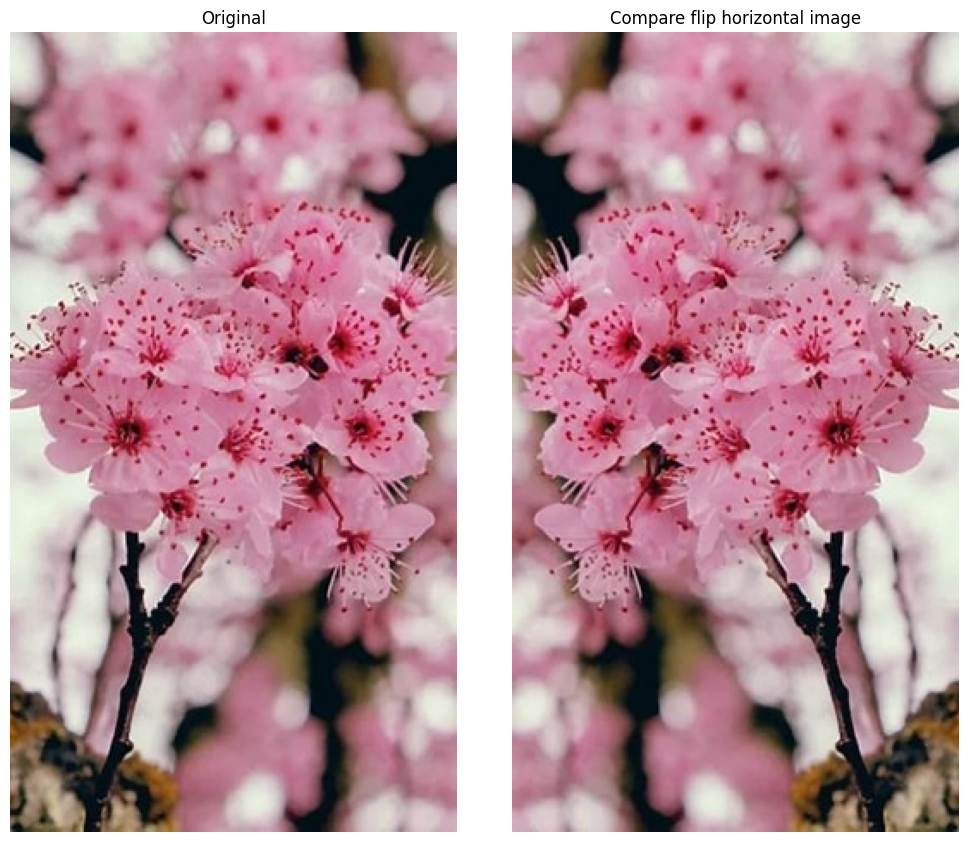

In [40]:
image_flip_h = np.fliplr(image)
compare(image, image_flip_h, "Compare flip horizontal image")

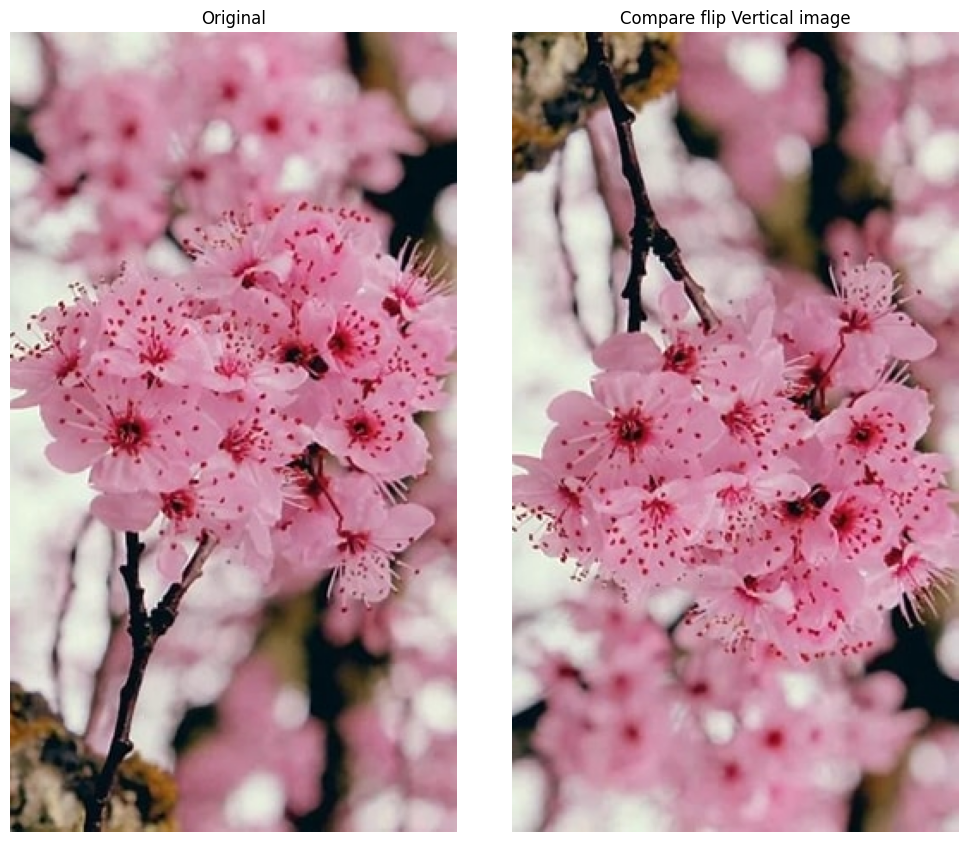

In [41]:
image_flip_v = np.flipud(image)
compare(image, image_flip_v, "Compare flip Vertical image")

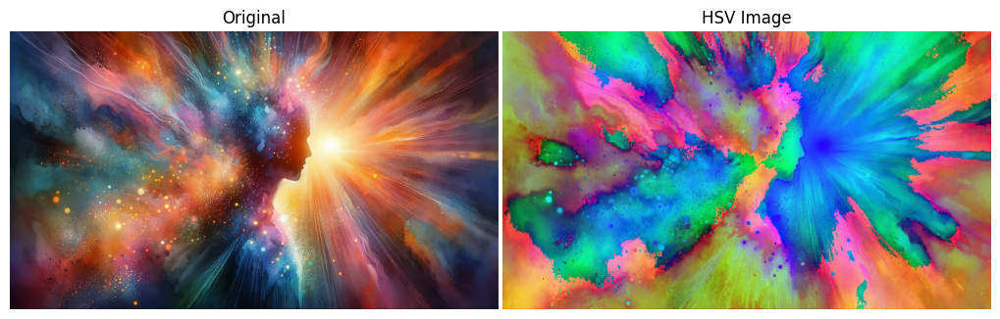

In [46]:
from skimage.color import rgb2hsv, rgba2rgb
import skimage.io

lena = skimage.io.imread("1_PRU06nWAlDsWFgi4rGfx_A.png")

# Konversi RGBA ke RGB
lena_rgb = rgba2rgb(lena)

hsv = rgb2hsv(lena_rgb)

compare(lena_rgb, hsv, "HSV Image")


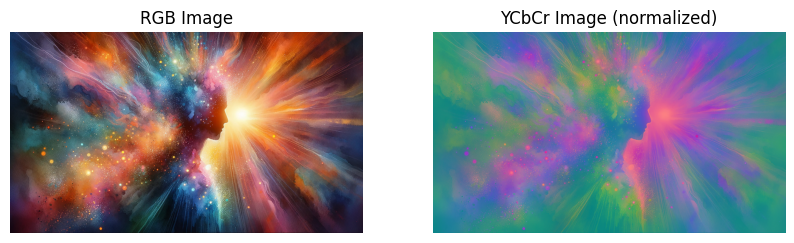

In [49]:
import matplotlib.pyplot as plt
from skimage import io, color
import numpy as np

# Baca gambar
prabowo = io.imread("1_PRU06nWAlDsWFgi4rGfx_A.png")

# Buang channel alpha (pakai hanya R,G,B)
prabowo_rgb = prabowo[:, :, :3]

# Konversi ke YCbCr
prabowo_ycbcr = color.rgb2ycbcr(prabowo_rgb)

# Normalisasi supaya imshow bisa tampilkan
prabowo_ycbcr_norm = (prabowo_ycbcr - prabowo_ycbcr.min()) / (prabowo_ycbcr.max() - prabowo_ycbcr.min())

# Tampilkan perbandingan
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(prabowo_rgb)
axes[0].set_title("RGB Image")
axes[0].axis("off")

axes[1].imshow(prabowo_ycbcr_norm)
axes[1].set_title("YCbCr Image (normalized)")
axes[1].axis("off")

plt.show()


In [50]:
prabowo_ycbcr_norm.shape

(686, 1200, 3)

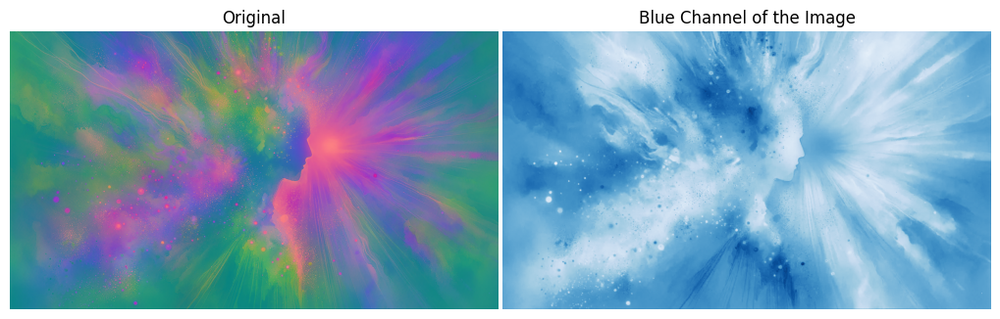

In [51]:
Cr = prabowo_ycbcr_norm[:, :, 2]

compare(prabowo_ycbcr_norm, Cr, "Blue Channel of the Image", "Blues_r")

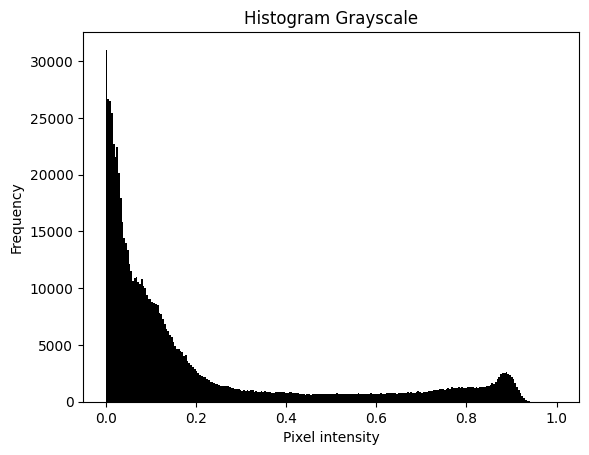

In [1]:
import matplotlib.pyplot as plt
from skimage import io, color

# Baca gambar
img = io.imread("https://th-thumbnailer.cdn-si-edu.com/aGr9gOggiiBZ4SBT2Fog0bO7D3A=/1000x750/filters:no_upscale():focal(2362x1597:2363x1598)/https://tf-cmsv2-smithsonianmag-media.s3.amazonaws.com/filer_public/18/f4/18f4e941-b85b-45ae-b07c-52eaa6ca1f84/gettyimages-1237093074.jpg")

# Konversi ke grayscale
gray = color.rgb2gray(img)

# Plot histogram
plt.hist(gray.ravel(), bins=256, range=(0,1), color='black')
plt.title("Histogram Grayscale")
plt.xlabel("Pixel intensity")
plt.ylabel("Frequency")
plt.show()


In [2]:
def plot_with_hist_channel(image, channel):
    channels = ["red", "green", "blue"]
    channel_idx = channels.index(channel)
    color = channels[channel_idx]

    extracted_channel = image[:, :, channel_idx]
    fig, (ax1, ax2) = plt.subplots(
        ncols=2, figsize=(18, 6)
    )  # , sharex=True, sharey=True)

    ax1.imshow(image)
    ax1.axis("off")
    ax2.hist(extracted_channel.ravel(), bins=256, color=color)
    ax2.set_title(f"{channels[channel_idx]} histogram")

In [3]:
gray.shape

(750, 1000)

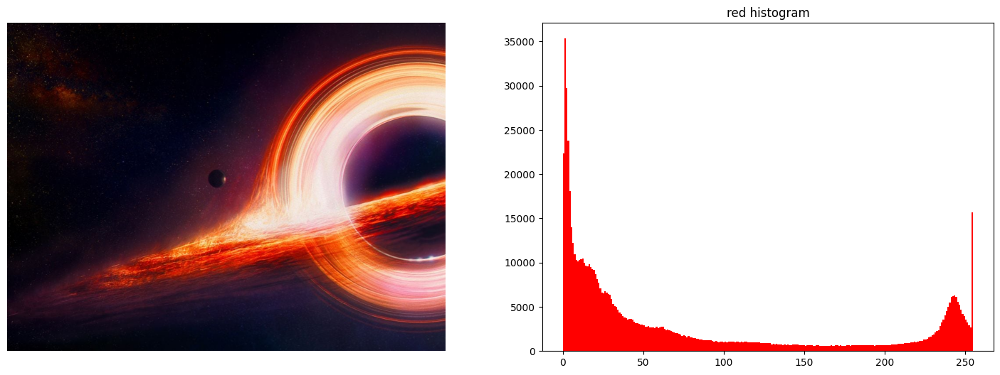

In [4]:
plot_with_hist_channel(img, "red")

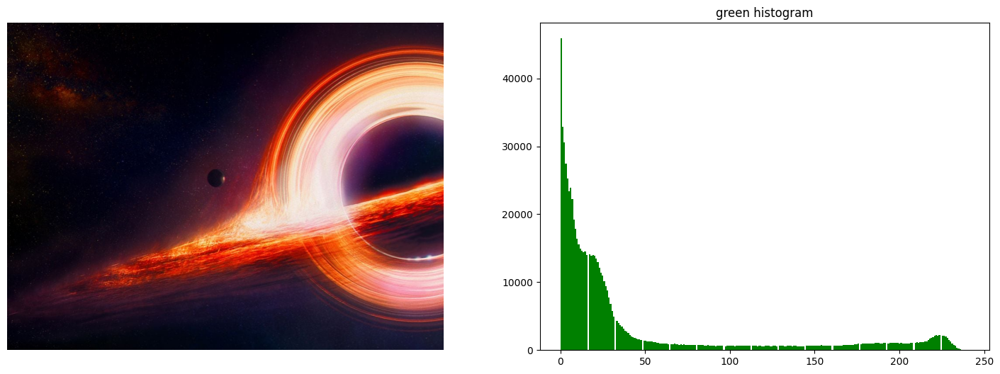

In [5]:
plot_with_hist_channel(img, "green")

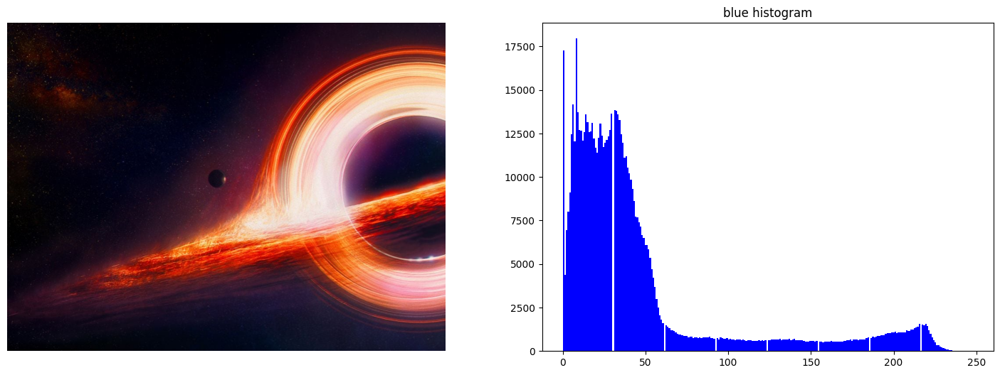

In [6]:
plot_with_hist_channel(img, "blue")

# Filters 

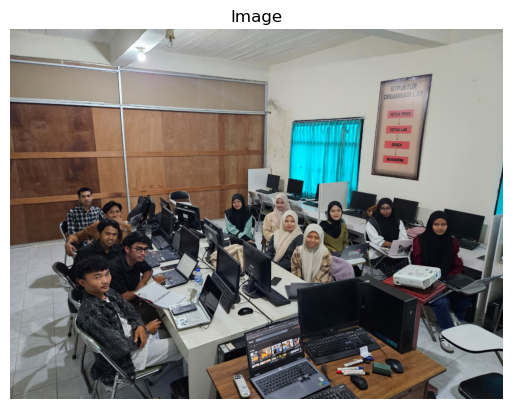

In [144]:
stag = io.imread("mhs.jpg")

show(stag)

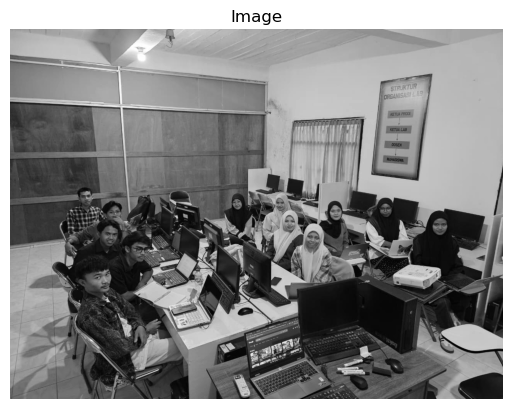

In [147]:
# Convert to graysacle
stag_gray = rgb2gray(stag)

show(stag_gray)

In [149]:
stag_gray.mean()

0.450036719944853

In [153]:
np.median(stag_gray)

0.478681568627451

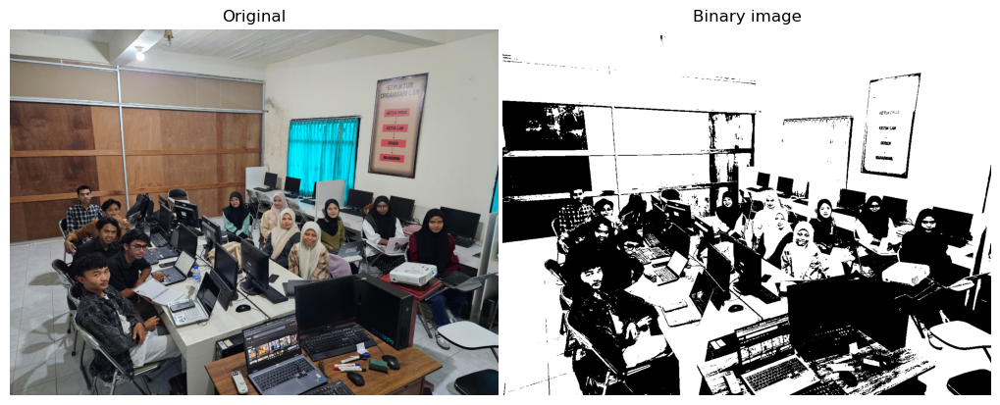

In [163]:
# Set threshold
threshold = 0.35
# Binarize
binary_image = stag_gray > threshold

compare(stag, binary_image, "Binary image")

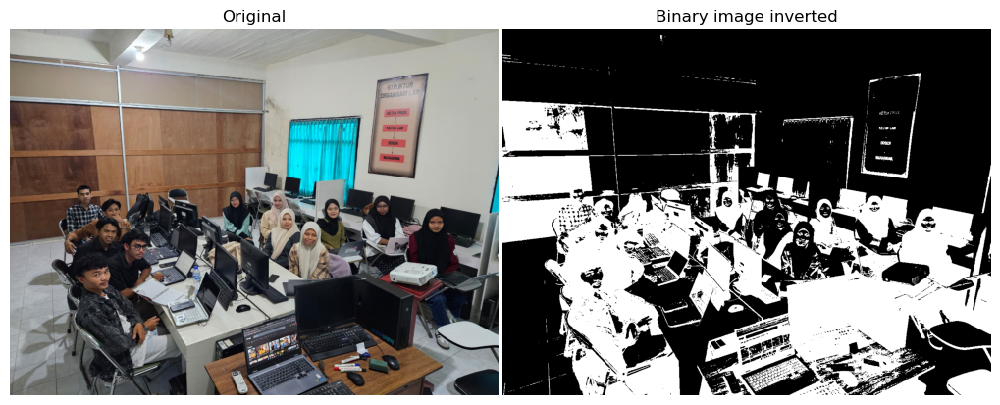

In [165]:
inverted_binary = stag_gray <= threshold

compare(stag, inverted_binary, "Binary image inverted")

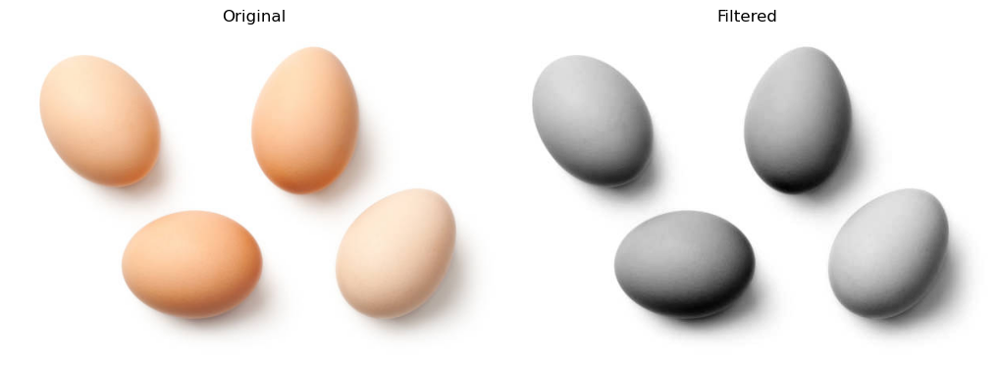

In [173]:
flower = io.imread("egg.jpg")

flower_gray = rgb2gray(flower)

compare(flower, flower_gray)

# Jelas kan apa maksudnya isodata, li, otus
Otsu → cari ambang (threshold) terbaik dengan meminimalkan variansi dalam kelas (cocok kalau histogram gambar punya 2 puncak jelas).

ISODATA → threshold dihitung secara iteratif dengan rata-rata intensitas piksel dari 2 kelompok (atas & bawah threshold).

Li → threshold ditentukan dengan meminimalkan entropi silang (cross entropy) antara gambar asli dan hasil biner.

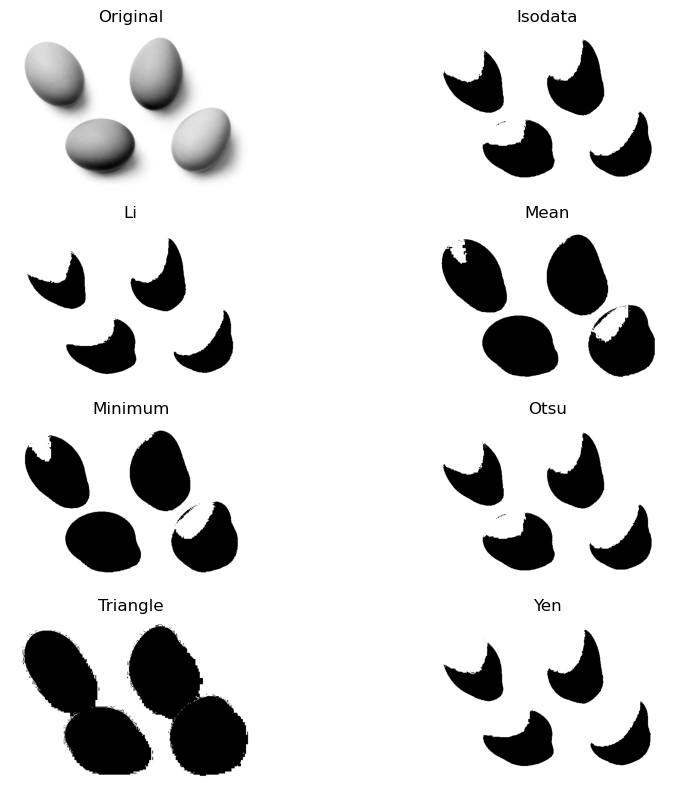

In [175]:
from skimage.filters import try_all_threshold

fig, ax = try_all_threshold(flower_gray, figsize=(10, 8), verbose=False)

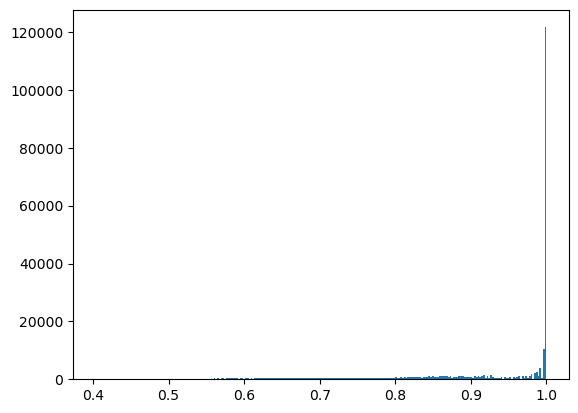

In [177]:
plt.hist(flower_gray.ravel(), bins=256);


In [ ]:
# Set threshold
threshold = 0.35
# Binarize
binary_image = stag_gray > threshold

compare(stag, binary_image, "Binary image")

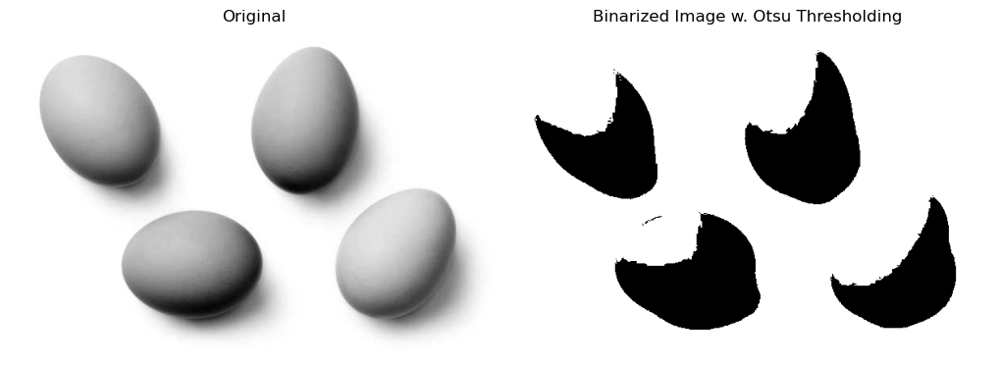

In [187]:
from skimage.filters import threshold_otsu

# Find optimal threshold with `threshold_otsu`
threshold = threshold_otsu(flower_gray)

# Binarize
binary_spiral = flower_gray > threshold

compare(flower_gray, binary_spiral, "Binarized Image w. Otsu Thresholding")

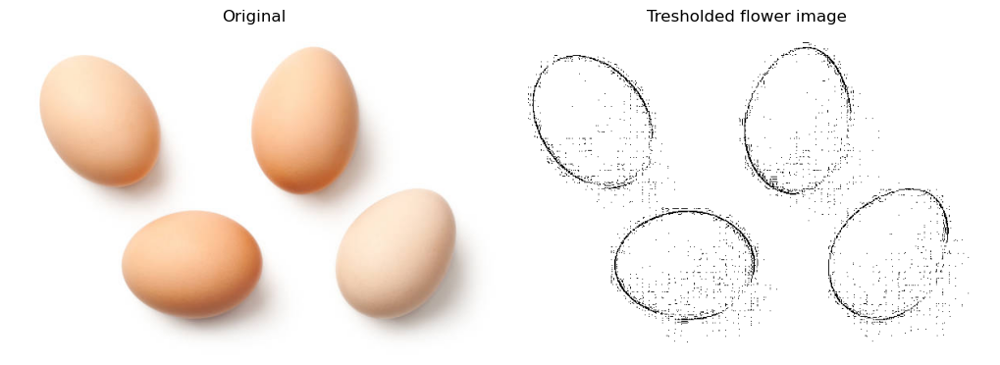

In [189]:
from skimage.filters import threshold_local

local_thresh = threshold_local(flower_gray, block_size=3, offset=0.0002)

binary_flower = flower_gray > local_thresh

compare(flower, binary_flower, "Tresholded flower image")

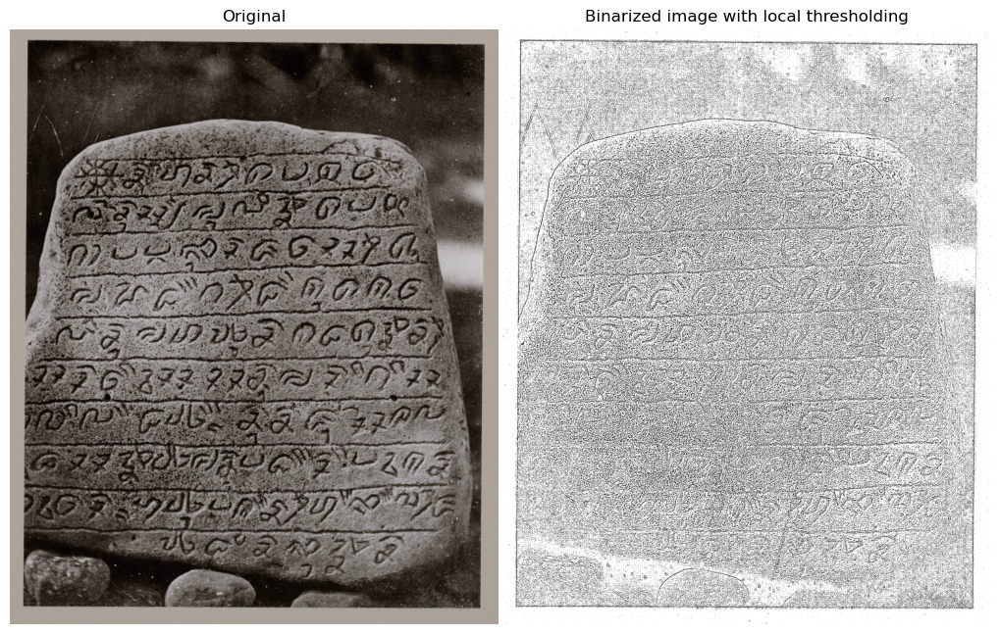

In [191]:
from skimage.filters import threshold_local

handwriting = io.imread("prasasti.jpg")
handwriting_gray = rgb2gray(handwriting)

# Find optimal threshold using local
local_thresh = threshold_local(handwriting_gray, offset=0.0003)

# Binarize
binary_handwriting = handwriting_gray > local_thresh

compare(handwriting, binary_handwriting, "Binarized image with local thresholding")

# Edge detection 
Edge detection adalah teknik dalam pengolahan citra (image processing) untuk mendeteksi tepi (batas) suatu objek di dalam gambar.

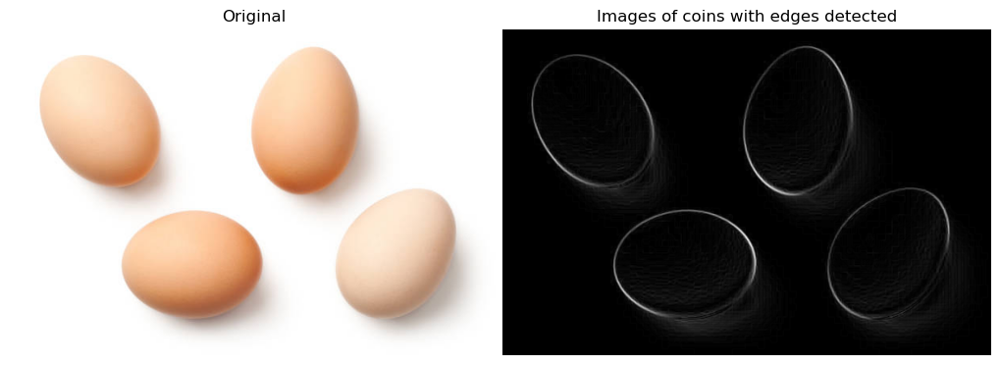

In [196]:
from skimage.filters import sobel

coins = io.imread("egg.jpg")
coins_gray = rgb2gray(coins)

coins_edge = sobel(coins_gray)

compare(coins, coins_edge, "Images of coins with edges detected")